### Laboratorium 6 - część projektowa

W tej części zajmiesz się wykorzystaniem punktów kluczowych do łączenia obrazów (_image stitching_). Celem zadania jest przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia obrazów. Istotne jest, by samodzielnie przejść całą ścieżkę: od detekcji punktów kluczowych i wyznaczenia ich desktryptorów, przez ich parowanie i znalezienie transformacji, po finalne połączenie obrazów. Rozwiązania oparte o gotowce w stylu black-box nie będą oceniane.

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy umożliwiały (1) użycie algorytmu SIFT, oraz (2) wykonanie transformacji geometrycznej.

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o ~połowę szerokości klatki),
* większe przesunięcie (o 3/4 szerokości lub więcej),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3b) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary wynikowych obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jeśli dla którejś pary metoda zawiodła, to dlaczego?*  
*Jaka była jakość dopasowania? Na jakiej podstawie ją określasz?*

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# def plot_keypoints_side_by_side(image1, keypoints1, image2, keypoints2, color=(0, 255, 0)):
#     img1_with_keypoints = cv2.drawKeypoints(
#         image1, 
#         keypoints1, 
#         None, 
#         color=color, 
#         flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
#     )
#     img2_with_keypoints = cv2.drawKeypoints(
#         image2, 
#         keypoints2, 
#         None, 
#         color=color, 
#         flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
#     )

#     fig, axes = plt.subplots(1, 2, figsize=(16, 6))
#     axes[0].imshow(img1_with_keypoints, cmap='gray')
#     axes[0].axis('off')
#     axes[1].imshow(img2_with_keypoints, cmap='gray')
#     axes[1].axis('off')
    
#     plt.tight_layout()
#     plt.show()

def plot_keypoints_side_by_side(image1, keypoints1, image2, keypoints2, color=(0, 255, 0), thickness=2):
    img1_with_keypoints = image1.copy()
    img2_with_keypoints = image2.copy()

    for kp in keypoints1:
        center = (int(kp.pt[0]), int(kp.pt[1]))
        radius = int(kp.size / 2)
        cv2.circle(img1_with_keypoints, center, radius, color, thickness)

    for kp in keypoints2:
        center = (int(kp.pt[0]), int(kp.pt[1]))
        radius = int(kp.size / 2)
        cv2.circle(img2_with_keypoints, center, radius, color, thickness)

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    axes[0].imshow(img1_with_keypoints)
    axes[0].axis('off')
    axes[1].imshow(img2_with_keypoints)
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

In [3]:
def plot_matches(image1, keypoints1, image2, keypoints2, matches, threshold):
    filtered_matches = [m for m in matches if m.distance < threshold]
    img_matches = cv2.drawMatches(image1, keypoints1, image2, keypoints2, 
                                   filtered_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(18, 6))
    plt.imshow(img_matches)
    plt.axis('off')
    plt.show()

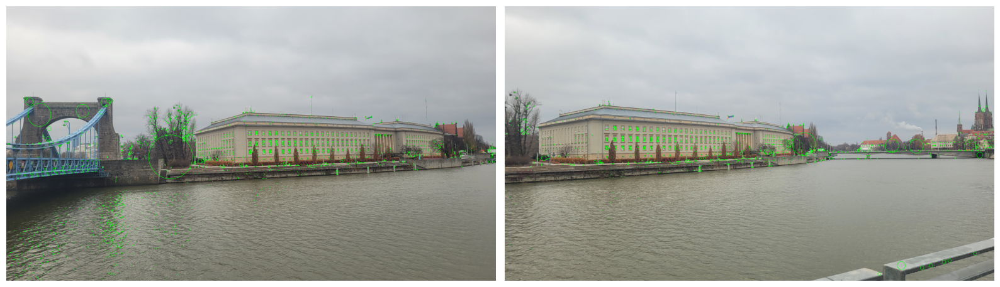

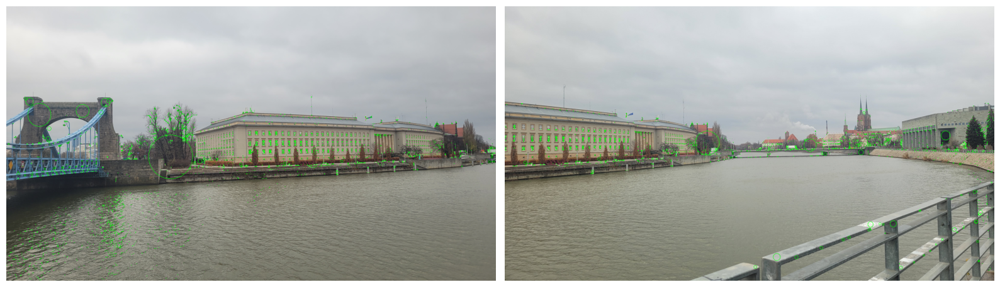

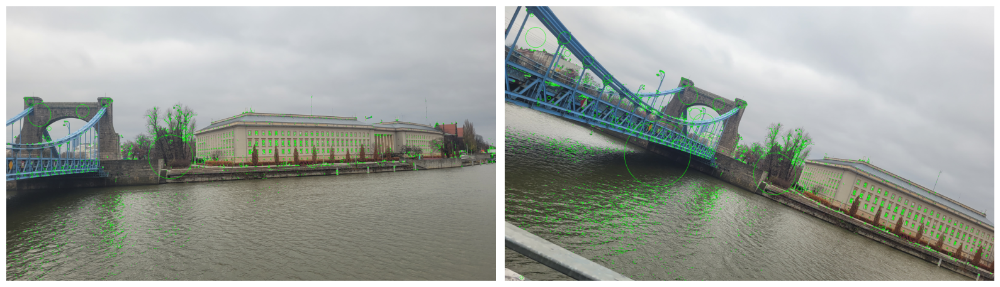

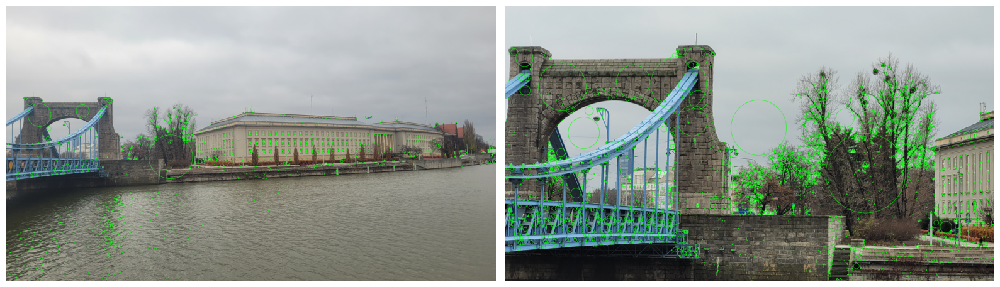

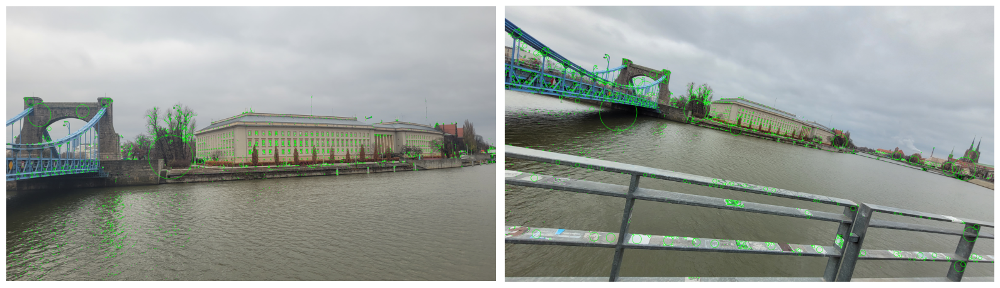

In [5]:
base_img = cv2.imread("base.jpg")[..., ::-1]
offset_imgs = [cv2.imread(f"offset_{i}.jpg")[..., ::-1] for i in range(1, 6)]

# base_img = cv2.imread("offset_1.jpg")[..., ::-1]
# offset_imgs = [cv2.imread("base.jpg")[..., ::-1]]

sift = cv2.SIFT_create(contrastThreshold=0.11, edgeThreshold=15, sigma=1.5)
base_keypoints, base_descriptors = sift.detectAndCompute(base_img, None)

offset_keypoints = []
offset_descriptors = []
for img in offset_imgs:
    keypoints, descriptors = sift.detectAndCompute(img, None)
    offset_keypoints.append(keypoints)
    offset_descriptors.append(descriptors)

for img, keypoints in zip(offset_imgs, offset_keypoints):
    plot_keypoints_side_by_side(base_img.copy(), base_keypoints, img.copy(), keypoints)

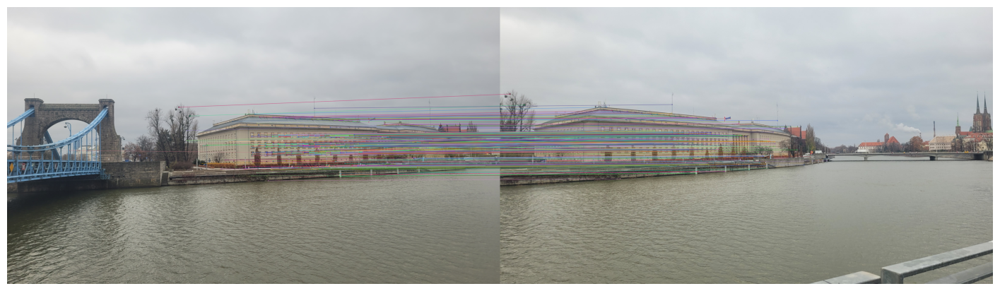

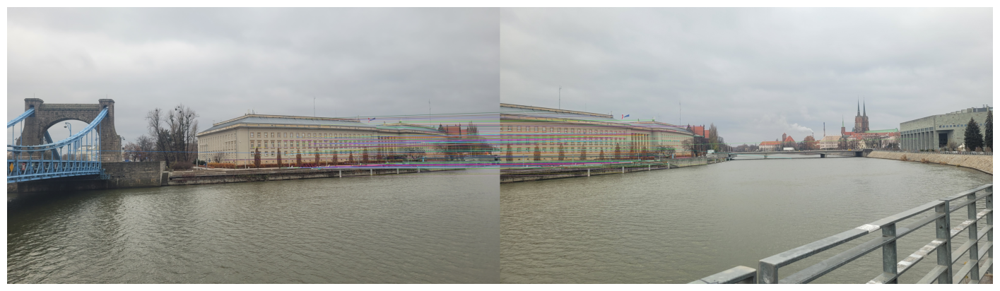

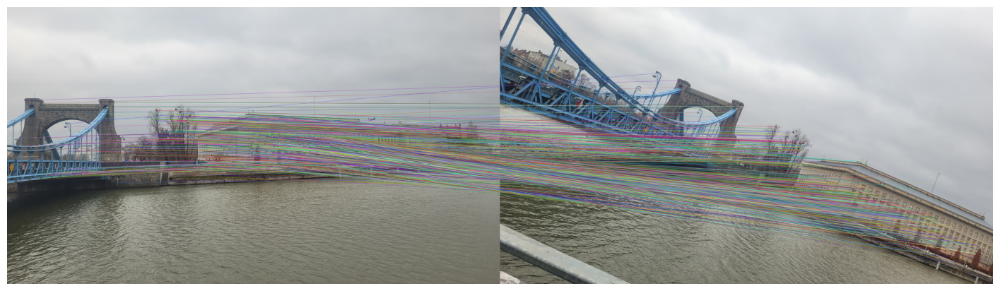

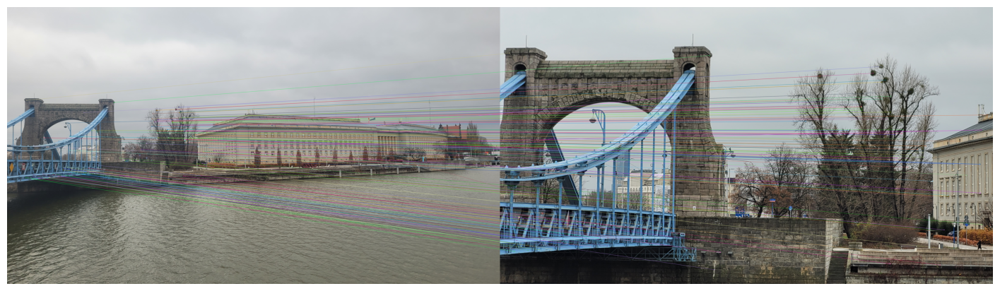

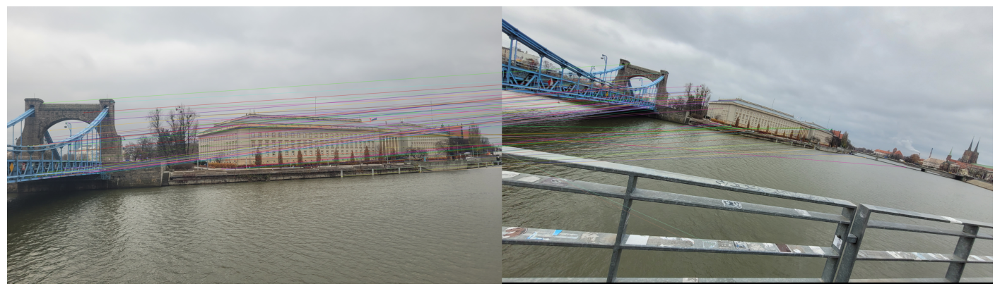

In [6]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

offset_matches = []
for descriptors in offset_descriptors:
    matches = bf.match(base_descriptors, descriptors)
    offset_matches.append(matches)

for i in range(len(offset_imgs)):
    plot_matches(base_img, base_keypoints, offset_imgs[i], offset_keypoints[i], offset_matches[i], 100)

In [7]:
def plot_transformed_and_original(warped, original):
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    
    axes[0].imshow(warped, cmap='gray')
    axes[0].set_title("Transformed Coke")
    axes[0].axis('off')
    
    axes[1].imshow(original, cmap='gray')
    axes[1].set_title("Table")
    axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

In [8]:
def get_transformed_size(img, M):
    h, w = img.shape[:2]
    corners = np.array([
        [0, 0],
        [w, 0],
        [w, h],
        [0, h]
    ], dtype=np.float32).reshape(-1, 1, 2)

    transformed_corners = cv2.perspectiveTransform(corners, M)
    x_min = int(np.min(transformed_corners[:, 0, 0]))
    x_max = int(np.max(transformed_corners[:, 0, 0]))
    y_min = int(np.min(transformed_corners[:, 0, 1]))
    y_max = int(np.max(transformed_corners[:, 0, 1]))

    return x_max, y_max, x_min, y_min

In [9]:
def transform_for_merge(img1, img2, H):
    x_max, y_max, x_min, y_min = get_transformed_size(img2, H)
    
    height = y_max - y_min
    width = x_max - x_min

    translation_matrix = np.array([
        [1, 0, -x_min],
        [0, 1, -y_min],
        [0, 0, 1]
    ], dtype=np.float32)

    adjusted_H = translation_matrix @ H
    warped = cv2.warpPerspective(img2, adjusted_H, (width, height))

    total_width = max(img1.shape[1], x_max) - min(0, x_min)
    total_hight = max(img1.shape[0], y_max) - min(0, y_min)
    img3 = np.zeros((total_hight, total_width, 3), dtype=np.uint8)
    img4 = np.zeros((total_hight, total_width, 3), dtype=np.uint8)

    img3[max(0, -y_min) : max(0, -y_min) + img1.shape[0], max(0, -x_min) : max(0, -x_min) + img1.shape[1], :] = img1

    img4[max(0, y_min) : max(0, y_min) + warped.shape[0], max(0, x_min) : max(0, x_min) + warped.shape[1], :] = warped

    return img3, img4

In [10]:
def merge(img1, img2, H):
    img3, img4 = transform_for_merge(img1, img2, H)

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    axes[0].imshow(img3, cmap='gray')
    axes[0].axis('off')
    axes[1].imshow(img4, cmap='gray')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

    mask1 = np.all(img3 == [0, 0, 0], axis=-1)
    mask2 = np.all(img4 == [0, 0, 0], axis=-1)

    common_pixels = ~mask1 & ~mask2
    merged = np.zeros_like(img3)

    merged[common_pixels] = cv2.addWeighted(img3, 0.5, img4, 0.5, 0)[common_pixels]

    merged[mask1 & ~mask2] = img4[mask1 & ~mask2]
    merged[mask2 & ~mask1] = img3[mask2 & ~mask1]
    plt.subplots(1, 1, figsize=(10,10))[1].imshow(merged);
    return merged

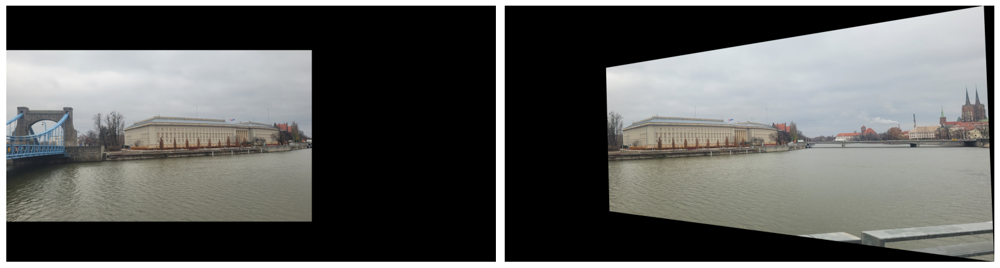

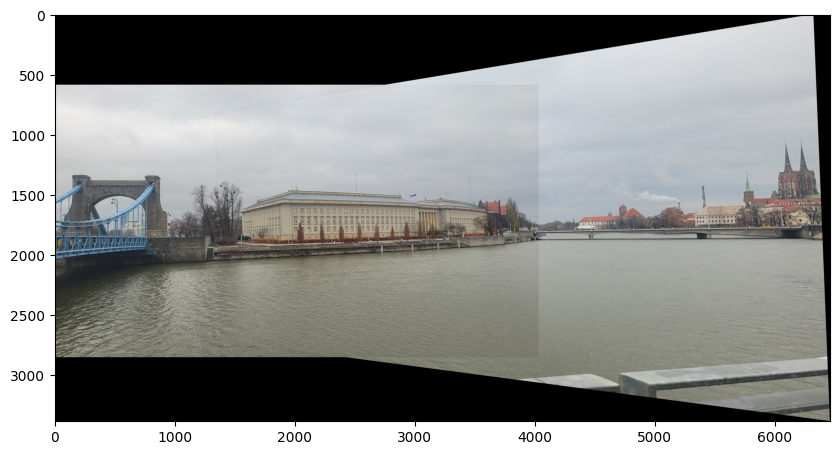

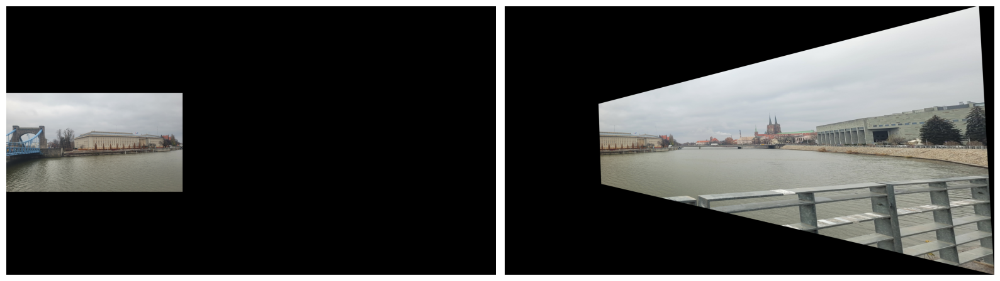

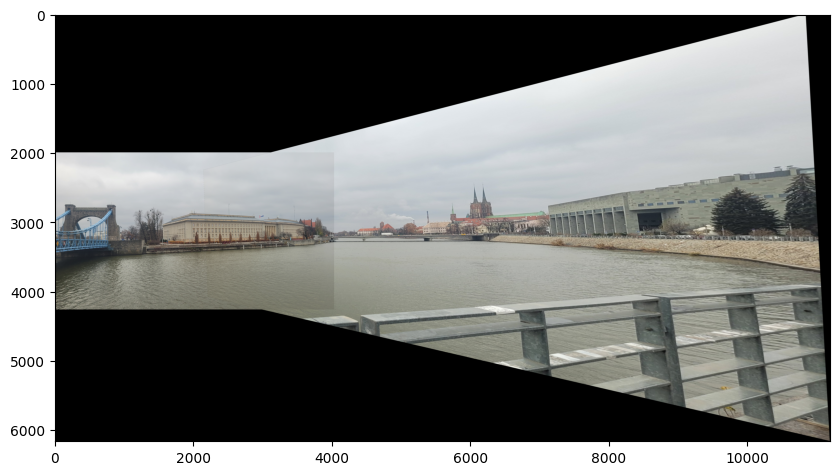

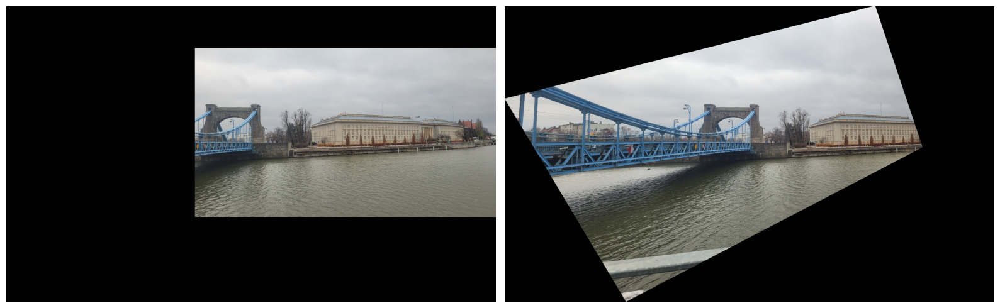

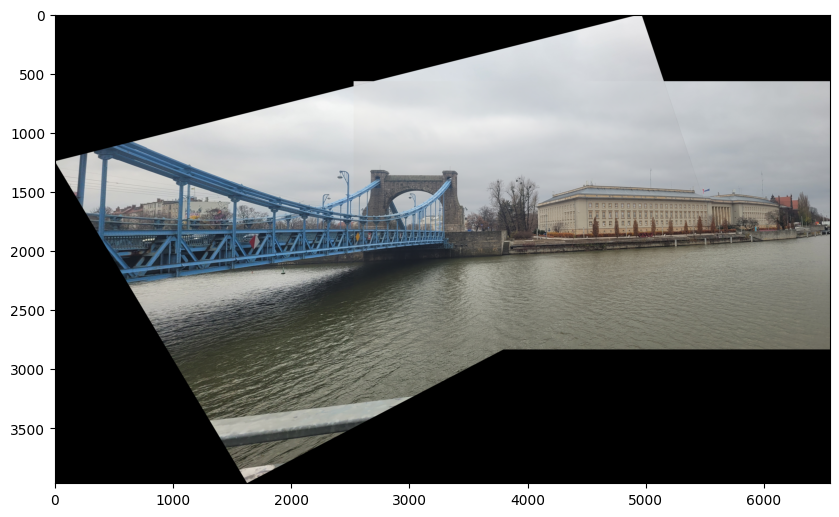

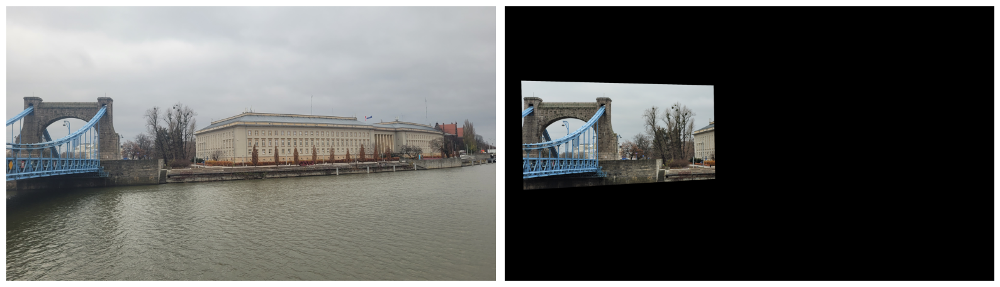

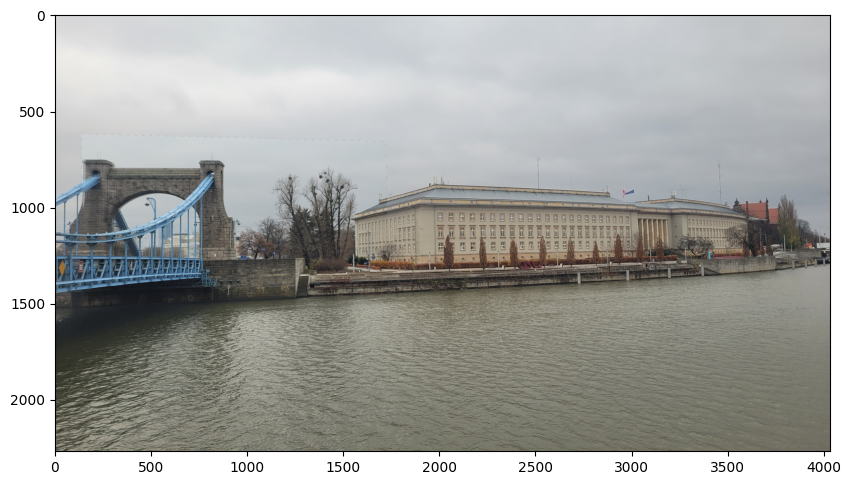

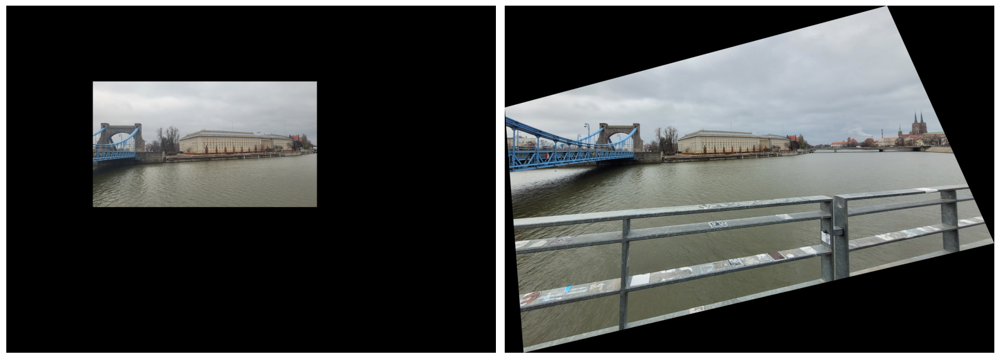

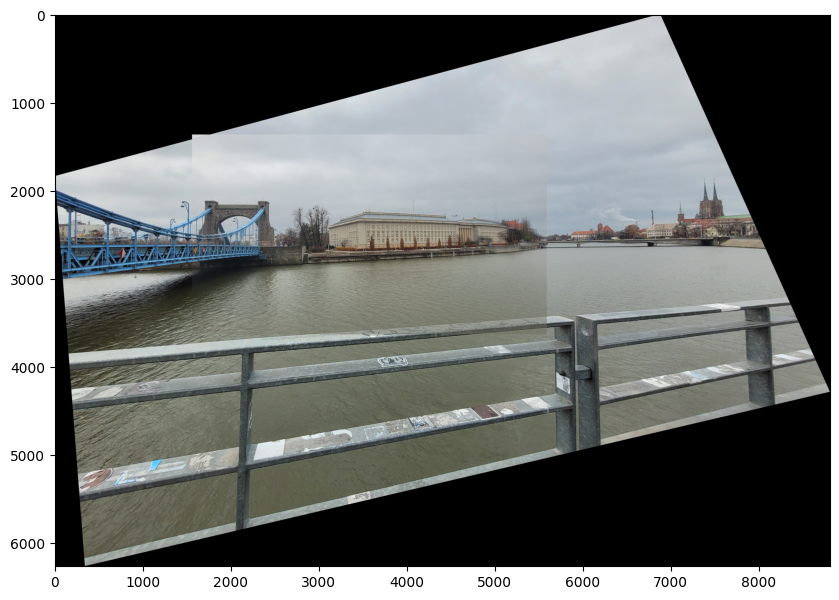

In [11]:
merged = []
for i in range(len(offset_imgs)):
    good_matches = []
    for m in offset_matches[i]:
        if m.distance < 200:
            good_matches.append(m)

    dst_pts = np.float32([base_keypoints[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    src_pts = np.float32([offset_keypoints[i][m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    merged.append(merge(base_img, offset_imgs[i], H))

# Match all

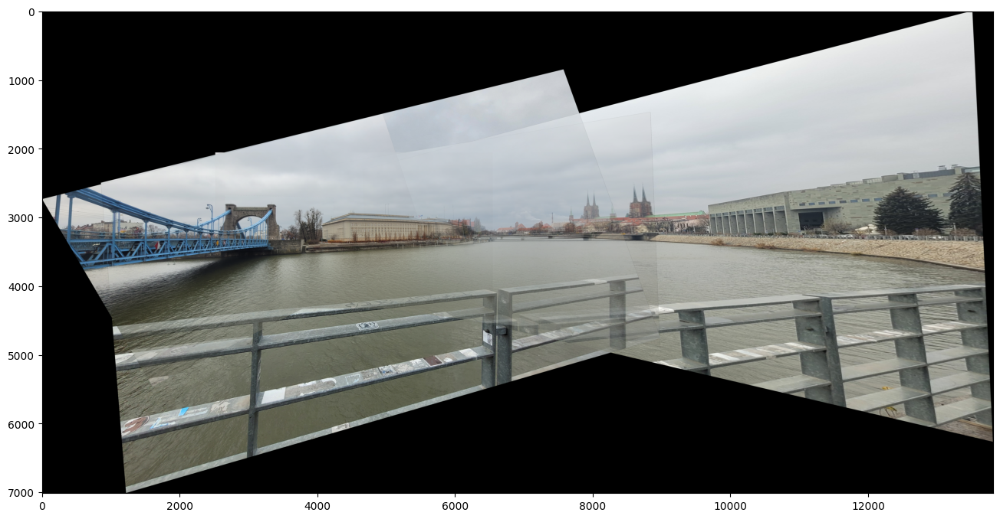

In [12]:
base_img = cv2.imread("base.jpg")[..., ::-1]
offset_imgs = [cv2.imread(f"offset_{i}.jpg")[..., ::-1] for i in range(1, 6)]

sift = cv2.SIFT_create(contrastThreshold=0.11, edgeThreshold=15, sigma=1.5)
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    
for img in offset_imgs:
    base_keypoints, base_descriptors = sift.detectAndCompute(base_img, None)
    keypoints, descriptors = sift.detectAndCompute(img, None)
    matches = bf.match(base_descriptors, descriptors)
    good_matches = [
        m for m in matches 
        if m.distance < 200 
        and m.queryIdx < len(base_keypoints) 
        and m.trainIdx < len(keypoints)
    ]
    dst_pts = np.float32([base_keypoints[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    src_pts = np.float32([keypoints[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    img1, img2 = transform_for_merge(base_img, img, H)

    mask1 = np.all(img1 == [0, 0, 0], axis=-1)
    mask2 = np.all(img2 == [0, 0, 0], axis=-1)

    common_pixels = ~mask1 & ~mask2
    base_img = np.zeros_like(img1)

    base_img[common_pixels] = cv2.addWeighted(img1, 0.5, img2, 0.5, 0)[common_pixels]

    base_img[mask1 & ~mask2] = img2[mask1 & ~mask2]
    base_img[mask2 & ~mask1] = img1[mask2 & ~mask1]

plt.subplots(1, 1, figsize=(16,12))[1].imshow(base_img);

In [13]:
def get_warped_with_offsets(img1, img2, H):
    x_max, y_max, x_min, y_min = get_transformed_size(img2, H)
    
    height = y_max - y_min
    width = x_max - x_min

    translation_matrix = np.array([
        [1, 0, -x_min],
        [0, 1, -y_min],
        [0, 0, 1]
    ], dtype=np.float32)

    adjusted_H = translation_matrix @ H
    warped = cv2.warpPerspective(img2, adjusted_H, (width, height))

    total_width = max(img1.shape[1], x_max) - min(0, x_min)
    total_hight = max(img1.shape[0], y_max) - min(0, y_min)
    img3 = np.zeros((total_hight, total_width, 3), dtype=np.uint8)
    img4 = np.zeros((total_hight, total_width, 3), dtype=np.uint8)

    off_y_left_1 = max(0, -y_min)
    off_y_right_1 = total_hight - off_y_left_1 - img1.shape[0]
    off_x_left_1 = max(0, -x_min)
    off_x_right_1 = total_width - off_x_left_1 - img1.shape[1]
    off_y_left_2 = max(0, y_min)
    off_y_right_2 = total_hight - off_y_left_2 - warped.shape[0]
    off_x_left_2 = max(0, x_min)
    off_x_right_2 = total_width - off_x_left_2 - warped.shape[1]

    img3[max(0, -y_min) : max(0, -y_min) + img1.shape[0], max(0, -x_min) : max(0, -x_min) + img1.shape[1], :] = img1

    img4[max(0, y_min) : max(0, y_min) + warped.shape[0], max(0, x_min) : max(0, x_min) + warped.shape[1], :] = warped

    return warped, off_y_left_1, off_y_right_1, off_x_left_1, off_x_right_1, off_y_left_2, off_y_right_2, off_x_left_2, off_x_right_2

In [14]:
def merge(img1, img2):
    mask1 = np.all(img1 == [0, 0, 0], axis=-1)
    mask2 = np.all(img2 == [0, 0, 0], axis=-1)

    common_pixels = ~mask1 & ~mask2
    merged = np.zeros_like(img1)

    merged[common_pixels] = cv2.addWeighted(img1, 0.5, img2, 0.5, 0)[common_pixels]

    merged[mask1 & ~mask2] = img2[mask1 & ~mask2]
    merged[mask2 & ~mask1] = img1[mask2 & ~mask1]
    plt.subplots(1, 1, figsize=(10,10))[1].imshow(merged);
    return merged

In [19]:
base_img = cv2.imread("base.jpg")[..., ::-1]
offset_imgs = [cv2.imread(f"offset_{i}.jpg")[..., ::-1] for i in range(1, 6)]

sift = cv2.SIFT_create(contrastThreshold=0.11, edgeThreshold=15, sigma=1.5)
base_keypoints, base_descriptors = sift.detectAndCompute(base_img, None)

offset_keypoints = []
offset_descriptors = []
for img in offset_imgs:
    keypoints, descriptors = sift.detectAndCompute(img, None)
    offset_keypoints.append(keypoints)
    offset_descriptors.append(descriptors)
    
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)

offset_matches = []
for descriptors in offset_descriptors:
    matches = bf.match(base_descriptors, descriptors)
    offset_matches.append(matches)

warpeds, off_y_left_1s, off_y_right_1s, off_x_left_1s, off_x_right_1s, off_y_left_2s, off_y_right_2s, off_x_left_2s, off_x_right_2s = [], [], [], [], [], [], [], [], []
for i in range(len(offset_imgs)):
    good_matches = []
    for m in offset_matches[i]:
        if m.distance < 200:
            good_matches.append(m)

    dst_pts = np.float32([base_keypoints[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    src_pts = np.float32([offset_keypoints[i][m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    warped, off_y_left_1, off_y_right_1, off_x_left_1, off_x_right_1, off_y_left_2, off_y_right_2, off_x_left_2, off_x_right_2 = get_warped_with_offsets(base_img, offset_imgs[i], H)
    warpeds.append(warped)
    off_y_left_1s.append(off_y_left_1)
    off_y_right_1s.append(off_y_right_1)
    off_x_left_1s.append(off_x_left_1)
    off_x_right_1s.append(off_x_right_1)
    off_y_left_2s.append(off_y_left_2)
    off_y_right_2s.append(off_y_right_2)
    off_x_left_2s.append(off_x_left_2)
    off_x_right_2s.append(off_x_right_2)

off_y_left_1_max = max(off_y_left_1s)
off_y_right_1_max = max(off_y_right_1s)
off_x_left_1_max = max(off_x_left_1s)
off_x_right_1_max = max(off_x_right_1s)
off_y_left_2_max = max(off_y_left_2s)
off_y_right_2_max = max(off_y_right_2s)
off_x_left_2_max = max(off_x_left_2s)
off_x_right_2_max = max(off_x_right_2s)

In [20]:
transformed_base = np.zeros((off_y_left_1_max + off_y_right_1_max + base_img.shape[0], off_x_left_1_max + off_x_right_1_max + base_img.shape[1], 3), dtype=np.uint8)
transformed_base[off_y_left_1_max : transformed_base.shape[0] - off_y_right_1_max, off_x_left_1_max : transformed_base.shape[1] - off_x_right_1_max, :] = base_img

In [21]:
transformed_warpeds = []
for i in range(len(warpeds)):
    warped = warpeds[i]
    off_y_left = off_y_left_2s[i] + off_y_left_1_max - off_y_left_1s[i]
    off_y_right = off_y_right_2s[i] + off_y_right_1_max - off_y_right_1s[i]
    off_x_left = off_x_left_2s[i] + off_x_left_1_max - off_x_left_1s[i]
    off_x_right = off_x_right_2s[i] + off_x_right_1_max - off_x_right_1s[i]
    new_hight = off_y_left + off_y_right + warped.shape[0]
    new_width = off_x_left + off_x_right + warped.shape[1]
    transformed_warped = np.zeros((new_hight, new_width, 3), dtype=np.uint8)
    transformed_warped[off_y_left : transformed_warped.shape[0] - off_y_right, off_x_left : transformed_warped.shape[1] - off_x_right, :] = warped
    transformed_warpeds.append(transformed_warped)

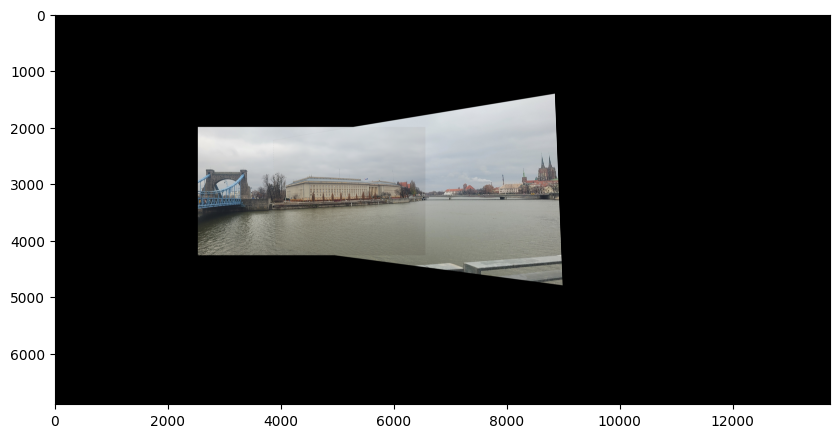

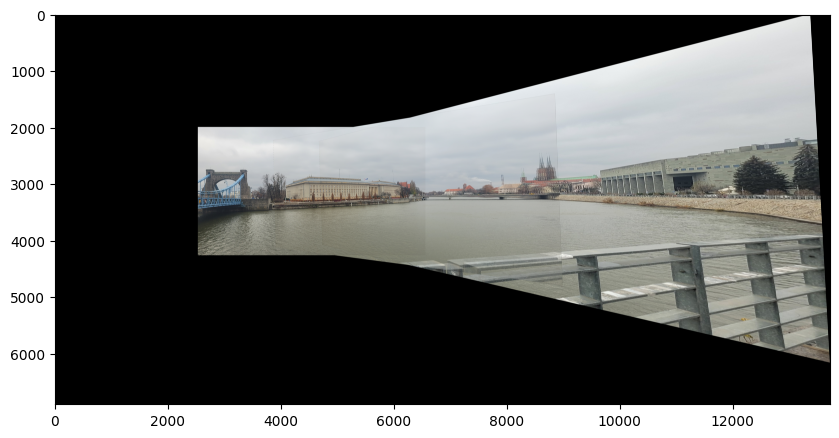

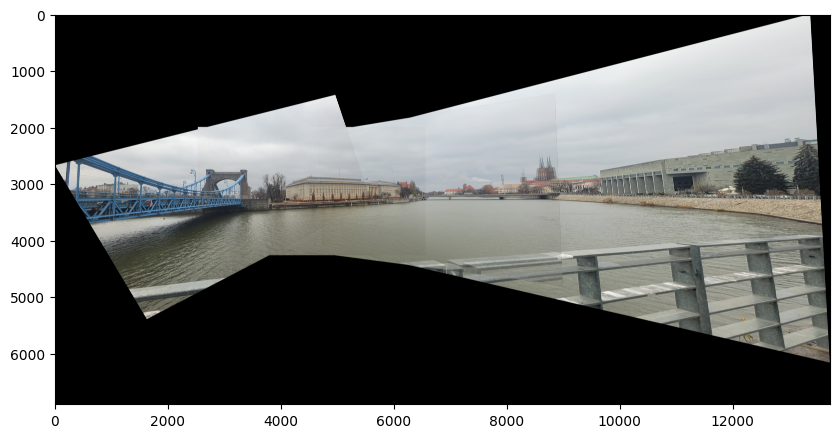

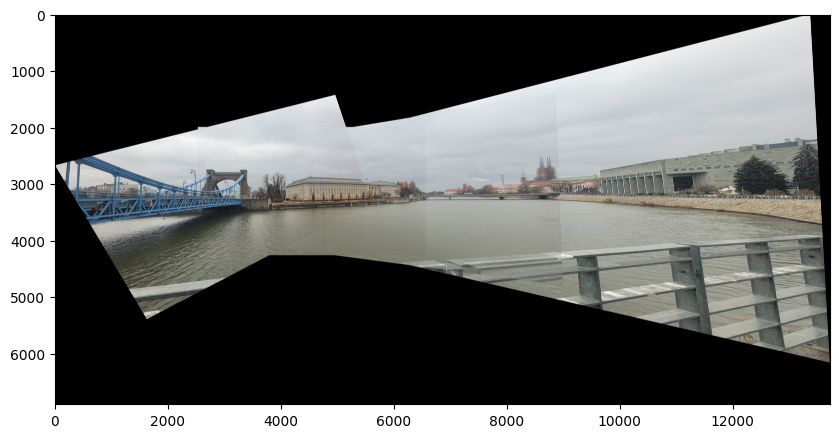

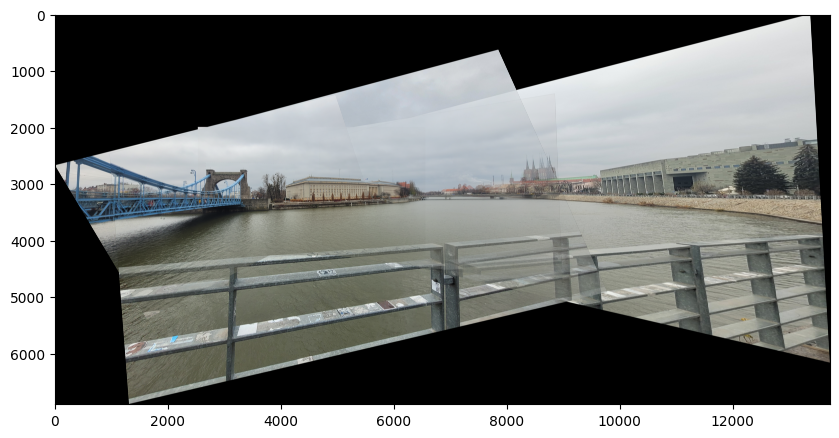

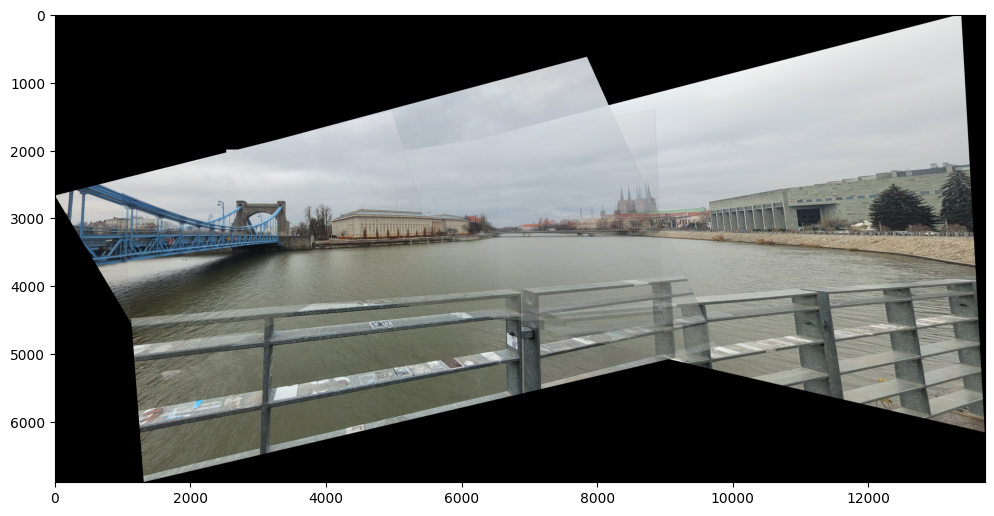

In [22]:
final_image = transformed_base.copy()
for transformed_warped in transformed_warpeds:
    final_image = merge(final_image, transformed_warped)
plt.subplots(1, 1, figsize=(12,8))[1].imshow(final_image);